In [10]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
import seaborn as sns
import os
import random
import librosa
import re
import keras
sns.set_context("poster")


from google.colab import drive
drive.mount('/content/gdrive')
path = '/content/gdrive/MyDrive/'
 

######## PLOTTING ########
def plot_cm(y_test, results, title, labels):
    plt.figure(figsize=(10,8))
    fx=sns.heatmap(confusion_matrix(y_test,results, normalize='pred'), annot=True, fmt=".2f",cmap="YlOrBr")
    fx.set_title(title);
    sns.set_context("poster")
    fx.set_xlabel('\n Predicted Values\n')
    fx.set_ylabel('Actual Values\n');
    fx.xaxis.set_ticklabels(labels)
    fx.yaxis.set_ticklabels(labels)
    plt.xticks(rotation = 60)
    plt.yticks(rotation = 0)
    plt.show()


######### MODEL ##############
def format_output(data):
    y1 = data.pop('Scene')
    y1 = np.array(y1)
    y2 = data.pop('Dimension')
    y2 = np.array(y2)
    return y1, y2

def build_model():
    input_layer = tf.keras.Input(shape= (4, 16000))

    dense1 = tf.keras.layers.Dense(512, activation='relu')(input_layer)
    dense2 = tf.keras.layers.Dense(256, activation='relu')(dense1)

    # first branch
    conv1 = tf.keras.layers.Conv1D(filters=32, kernel_size=3, activation='relu', padding='same')(dense2)
    pool1 = tf.keras.layers.MaxPooling1D(pool_size=2)(conv1)
    conv2 = tf.keras.layers.Conv1D(filters=16, kernel_size=3, activation='relu', padding='same')(pool1)
    pool2 = tf.keras.layers.MaxPooling1D(pool_size=2)(conv2)
    flatten = tf.keras.layers.Flatten()(pool2)
    output1 = tf.keras.layers.Dense(6, activation='softmax', name='output1')(flatten)

    # second branch
    conv3 = tf.keras.layers.Conv1D(filters=32, kernel_size=3, activation='relu', padding='same')(dense2)
    pool3 = tf.keras.layers.MaxPooling1D(pool_size=2)(conv3)
    conv4 = tf.keras.layers.Conv1D(filters=16, kernel_size=3, activation='relu', padding='same')(pool3)
    pool4 = tf.keras.layers.MaxPooling1D(pool_size=2)(conv4)
    flatten2 = tf.keras.layers.Flatten()(pool4)
    output2 = tf.keras.layers.Dense(5, activation='softmax', name='output2')(flatten2)

    # define the model with two outputs
    feature_model = tf.keras.Model(inputs=input_layer, outputs=[output1, output2])
   
    return feature_model


######## PROCESSING DATAFRAME #########
def flatten(input):
  flat_list = []
  for sublist in input:
      for num in sublist:
          flat_list.append(num)
  return flat_list

def padding(length, list):
    diff_len = length - len(list)
    if diff_len < 0:
        return list
    return list + [0] * diff_len

def extract_features(df):
    df['Spectrogram'] = df['Data'].apply(lambda x: librosa.amplitude_to_db(abs(librosa.stft(x)))) #Spectrogram
    df['ZCR'] = df['Data'].apply(lambda x:  librosa.feature.zero_crossing_rate(x))  # Zero Crossing Rate
    df['RMS'] = df['Data'].apply(lambda x: librosa.feature.rms(y= x))               # RMS
    df['MFCC'] = df['Data'].apply(lambda x:  librosa.feature.mfcc(y= x, sr=16000))  # MFCC  

    #Flattening 
    df['ZCR'] = df['ZCR'].agg(lambda x: flatten(x))
    df['MFCC'] = df['MFCC'].agg(lambda x: flatten(x))
    df['RMS'] = df['RMS'].agg(lambda x: flatten(x))
    df['Unblended Data']= df['Unblended Data'].agg(lambda x: x.tolist())
    df['Data']= df['Data'].agg(lambda x: x.tolist())

    # Padding
    length = max(len(df['ZCR'][0]), len(df['RMS'][0]), len(df['Data'][0]))#  len(df['Spectrogram'][0]) , len(df['MFCC'][0]))
    
    df['Data'] = df['Data'].agg(lambda x: padding(length, x))
    df['Unblended Data'] = df['Unblended Data'].agg(lambda x: padding(length, x))
    df['ZCR'] = df['ZCR'].agg(lambda x: padding(length, x))
    #df['MFCC'] = df['MFCC'].agg(lambda x: padding(length, x))
    df['RMS'] = df['RMS'].agg(lambda x: padding(length, x))

    return df

# Adding one random audio file from each dimension on top of each audio file from each scene
# Combining comes with a random percentage of the dimension
def blending_audios(row, dimension, scenes, df, labels, original_data): 
  if row['Label'] in scenes:
        original_data.append(row['Data'])
        audio_dim = random.choice(df.loc[df['Label'] == dimension]['Data'].values)
        blended_audio = row['Data'] + random.randint(0,100) * audio_dim[:len(row['Data'])]
        blended_audio = (blended_audio- np.mean(abs(blended_audio)))/ max(abs(blended_audio)) # Normalizing
        labels.append(str(row['Label']) + str(dimension))
        return  blended_audio
  else:
       return 'None'


########## DATA ###############
def load_data():
  path = 'Data/out.csv'
  if os.path.isfile(path):
    df = pd.read_csv(path)
  else:
    # Scenes
    audio_data_voices, audio_labels_voices   = load_voices()
    audio_data_TAU, audio_labels_TAU       = load_TAU()
    audio_data_DEMAND, audio_labels_DEMAND = load_demand()
    audio_data_kids, audio_labels_kids     = load_kids()
    audio_data_noise, audio_labels_noise   = load_noise()
    audio_data_music, audio_labels_music   = load_music()

    data = audio_data_TAU + audio_data_DEMAND + audio_data_kids + audio_data_noise + audio_data_music + audio_data_voices
    labels = audio_labels_TAU + audio_labels_DEMAND + audio_labels_kids + audio_labels_noise + audio_labels_music + audio_labels_voices
    d = {'Data':data,'Label':labels}
    df = pd.DataFrame(d)
    df.head()
    df['Label'].value_counts()
    # Mapping
    df["Label"] = df["Label"].map({"NATURE": 0, 
                                "CAFE": 1,
                                'PUBLIC_TRANSPORT':2,
                                'HOME':3,
                                'OFFICE':4,
                                'CITY':5,
                                'voices': 'A',
                                'kids': 'B',
                                'music': 'C',
                                'noise': 'D'
                                })
    #Sampling
    df = df.groupby('Label').sample(n=50)
    #Cleaning
    df.reset_index(drop = True, inplace = True)
    assert df['Data'].isnull().values.any() == False
    
    del data, labels, audio_data_TAU, audio_data_DEMAND , audio_data_kids,audio_data_noise, audio_data_music , audio_data_voices
    return df
  

def load_TAU():
  TAU_DIR = path + 'Data/TAU-urban-acoustic-scenes-2022-mobile-development/audio'

  audio_data_TAU = []
  audio_labels_TAU = []

  for file in os.listdir(TAU_DIR):
    if file.endswith('.wav'):
      try:
        file_path = os.path.join(TAU_DIR, file)

        # Extracting data
        data, samplerate = librosa.load(file_path, sr=16000, mono = True)
        if len(data) == 16000:
          audio_data_TAU.append(data)

        # Extracting labels
        res = file.split('-')[0]
        audio_labels_TAU.append(res)
      except:
          print(f'File {file} failed to load.')

  # Adjust labels
  audio_labels_TAU = ['PUBLIC_TRANSPORT' if label in ['airport','bus','metro',
                                                      'metro_station', 'street_traffic', 'tram'] else
                    'CITY' if label in['shopping_mall', 'street_pedestrian', 'public_square', 'park'] else
                    '' for label in audio_labels_TAU] 

  return audio_data_TAU, audio_labels_TAU

def load_kids():
  KID_DIR = path + 'Data/Parent-ChildVocalInteraction'

  audio_data_KID = []
  audio_labels_KID = []

  for root, dirs, files in os.walk(KID_DIR):
    for file in files:
      if file.endswith('.wav'):
        #try:
          file_path = os.path.join(root, file)

          data, samplerate = librosa.load(file_path, sr=16000, mono = True)
          for i in range(0, len(data)):
            sampling_val = random.random()
            if sampling_val < 0.0001:
                segment = data[i:i+16000]
                if len(segment) == 16000:
                    audio_data_KID.append(segment)


      # except:
        #    print(f'File {file} failed to load.')

    audio_labels_KID = ['kids'] * len(audio_data_KID)
  return audio_data_KID, audio_labels_KID

def load_voices():
  VOICE_DIR = path + 'Data/LibriSpeech/dev-clean' 

  audio_data_VOICE = []
  audio_labels_VOICE = []

  for root, dirs, files in os.walk(VOICE_DIR):
    for file in files:
      if file.endswith('.flac'):  # Check if the file has a .mp3 extension
        file_path = os.path.join(root, file)
        data, samplerate = librosa.load(file_path, sr=16000, mono=True)
        
         # Extracting data, splitting one audio into smaller bits
        split_length = 1
        split_size = int(split_length * samplerate)

        for i, start in enumerate(range(0, len(data), split_size)):
            audio_data_VOICE.append(data[i:i+split_size])
                        
  audio_labels_VOICE = ['voices'] * len(audio_data_VOICE)
  return audio_data_VOICE, audio_labels_VOICE

def load_demand():
  DEMAND_DIR = path +'Data/DEMAND'

  audio_data_DEM = []
  audio_labels_DEM = []

  for root, dirs, files in os.walk(DEMAND_DIR):
    for file in files:   
      try:     
        file_path = os.path.join(root, file)

        # Extracting data
        data, samplerate = librosa.load(file_path, sr=16000, mono = True)

        # Splitting one audio into smaller bits
        split_length = 1
        split_size = int(split_length * samplerate)

        for i, start in enumerate(range(0, len(data), split_size)):
            audio_data_DEM.append(data[i:i+split_size])
            
            # Extracting labels
            res = file_path.split('/')[-2]
            audio_labels_DEM.append(res)

      except:
        print(f'File {file} failed to load.')

  # Adjust labels
  audio_labels_DEM = ['HOME' if label in ['DKITCHEN','DLIVING','DWASHING'] else 
                   'NATURE' if label in ['NFIELD','NPARK','NRIVER'] else
                   'OFFICE' if label in ['OHALLWAY','OMEETING','OOFFICE'] else
                   'CAFE' if label in ['PCAFETER','PRESTO'] else
                  'PUBLIC_TRANSPORT' if label in [ 'TBUS','TCAR','TMETRO'] else
                   'CITY' for label in audio_labels_DEM] 

  return audio_data_DEM, audio_labels_DEM

def load_music():
  MUSIC_DIR = path + 'Data/music' 

  audio_data_MUSIC = []
  audio_labels_MUSIC = []

  for file in os.listdir(MUSIC_DIR):
    if file.endswith('.wav'):
      try:
        file_path = os.path.join(MUSIC_DIR, file)

        #Extracting data
        data, samplerate = librosa.load(file_path, sr=16000, mono = True)

        # Extracting data, splitting one audio into smaller bits
        split_length = 1
        split_size = int(split_length * samplerate)

        for i, start in enumerate(range(0, len(data), split_size)):
            audio_data_MUSIC.append(data[i:i+split_size])

      except:
          print(f'File {file} failed to load.')

  audio_labels_MUSIC = ['music'] * len(audio_data_MUSIC)
  return audio_data_MUSIC, audio_labels_MUSIC

def load_noise():
    NOISE_DIR = path + 'Data/ESC-50-master/audio' 

    audio_data_NOISE = []

    for file in os.listdir(NOISE_DIR):
        if file.endswith('.wav'):
            try:
                file_path = os.path.join(NOISE_DIR, file)

                #Extracting data
                data, samplerate = librosa.load(file_path, sr=16000, mono = True)

                # Extracting data, splitting one audio into smaller bits
                samplerate = 16000
                split_length = 1
                split_size = int(split_length * samplerate)
            
                for i, start in enumerate(range(0, len(data), split_size)):
                    audio_data_NOISE.append(data[i:i+split_size])
                
            except:
                print(f'File {file} failed to load.')

    audio_label_NOISE = ['noise'] * len(audio_data_NOISE)
    return audio_data_NOISE, audio_label_NOISE

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
import tensorboard
%load_ext tensorboard

In [3]:
# Initializing main things
df         = load_data()
dimensions = ['A','B','C','D']
scenes     = [0,1,2,3,4,5]

# Saving the dataframe
#os.makedirs('/Data/out.csv', exist_ok=True)  
#df.to_csv('data.csv') 

# Combining audio
audio_data = []
labels = []
original_data = []

for dimension in dimensions:
    audio_data.append(df.apply(lambda row: blending_audios(row, dimension, scenes, df, labels, original_data), axis = 1))
combined_data = [item for sublist in audio_data for item in sublist if item != 'None']  

df = pd.DataFrame({'Label': labels, 'Data': combined_data, 'Unblended Data': original_data})  
df['Scene'] = df['Label'].apply(lambda x: int(re.findall('\d', x)[0]))
df['Dimension'] = df['Label'].apply(lambda x: re.findall('[A-Za-z]', x)[0]) 

# Adding Features
df = extract_features(df)

# Saving the dataframe
#os.makedirs('Data/out.csv', exist_ok=True)  
#df.to_csv('out.csv')   
df['Dimension'].replace({'A': 1, 'B': 2, 'C':3, 'D':4}, inplace = True)

# Setting up data for the model
X = df[['Data',   'Unblended Data', 'RMS', 'ZCR']]
y = df[['Scene', 'Dimension']]

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=123)

# Converting to tensor
X_train = X_train.values.tolist()
X_train = np.array([np.array(val) for val in X_train])
X_train = tf.convert_to_tensor(X_train)

X_test = X_test.values.tolist()
X_test = np.array([np.array(val) for val in X_test])
X_test = tf.convert_to_tensor(X_test)

y_train = format_output(y_train)                            
y_test = format_output(y_test)

<ipython-input-3-f02eafcd3744>:17: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  combined_data = [item for sublist in audio_data for item in sublist if item != 'None']


In [4]:
import gc
gc.collect()

1303

In [11]:
feature_model = build_model()
model = build_model()
model.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 4, 16000)]   0           []                               
                                                                                                  
 dense_14 (Dense)               (None, 4, 512)       8192512     ['input_8[0][0]']                
                                                                                                  
 dense_15 (Dense)               (None, 4, 256)       131328      ['dense_14[0][0]']               
                                                                                                  
 conv1d_28 (Conv1D)             (None, 4, 32)        24608       ['dense_15[0][0]']               
                                                                                            

In [12]:
feature_model = build_model()
logdir="logs/new/"
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

# Training
feature_model.compile(optimizer="adam",
              loss={'output1': 'sparse_categorical_crossentropy', 'output2': 'sparse_categorical_crossentropy'},
              metrics=['accuracy'])

feature_model.fit(X_train,  y_train, epochs=15, batch_size=32,callbacks=[tensorboard_callback])

Epoch 1/15
29/29 [==============================] - 7s 153ms/step - loss: 2.9173 - output1_loss: 1.6379 - output2_loss: 1.2794 - output1_accuracy: 0.3011 - output2_accuracy: 0.4400
Epoch 2/15
29/29 [==============================] - 6s 205ms/step - loss: 1.6100 - output1_loss: 1.0822 - output2_loss: 0.5278 - output1_accuracy: 0.5922 - output2_accuracy: 0.8522
Epoch 3/15
29/29 [==============================] - 5s 159ms/step - loss: 0.7145 - output1_loss: 0.5695 - output2_loss: 0.1449 - output1_accuracy: 0.7933 - output2_accuracy: 0.9800
Epoch 4/15
29/29 [==============================] - 4s 146ms/step - loss: 0.2902 - output1_loss: 0.2348 - output2_loss: 0.0554 - output1_accuracy: 0.9356 - output2_accuracy: 0.9922
Epoch 5/15
29/29 [==============================] - 5s 184ms/step - loss: 0.0769 - output1_loss: 0.0591 - output2_loss: 0.0177 - output1_accuracy: 0.9956 - output2_accuracy: 0.9978
Epoch 6/15
29/29 [==============================] - 5s 178ms/step - loss: 0.0438 - output1_loss

In [13]:
# Testing
feature_model.evaluate(X_test, {'output1': y_test[0], 'output2': y_test[1]})


predictions_wfeatures = feature_model.predict(X_test)       # Getting predictions
results_output1= [np.argmax(pred) for pred in predictions_wfeatures[0]]
results_output2 = [np.argmax(pred) for pred in predictions_wfeatures[1]]

10/10 [==============================] - 1s 55ms/step


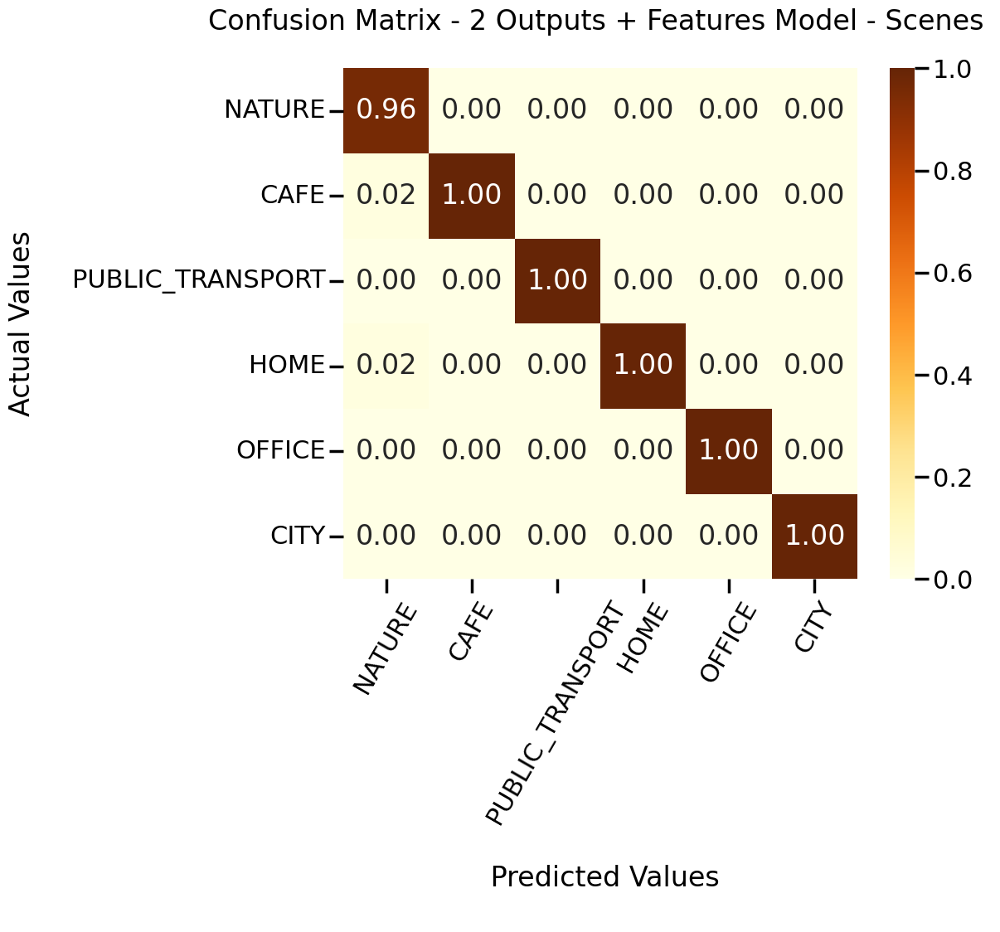

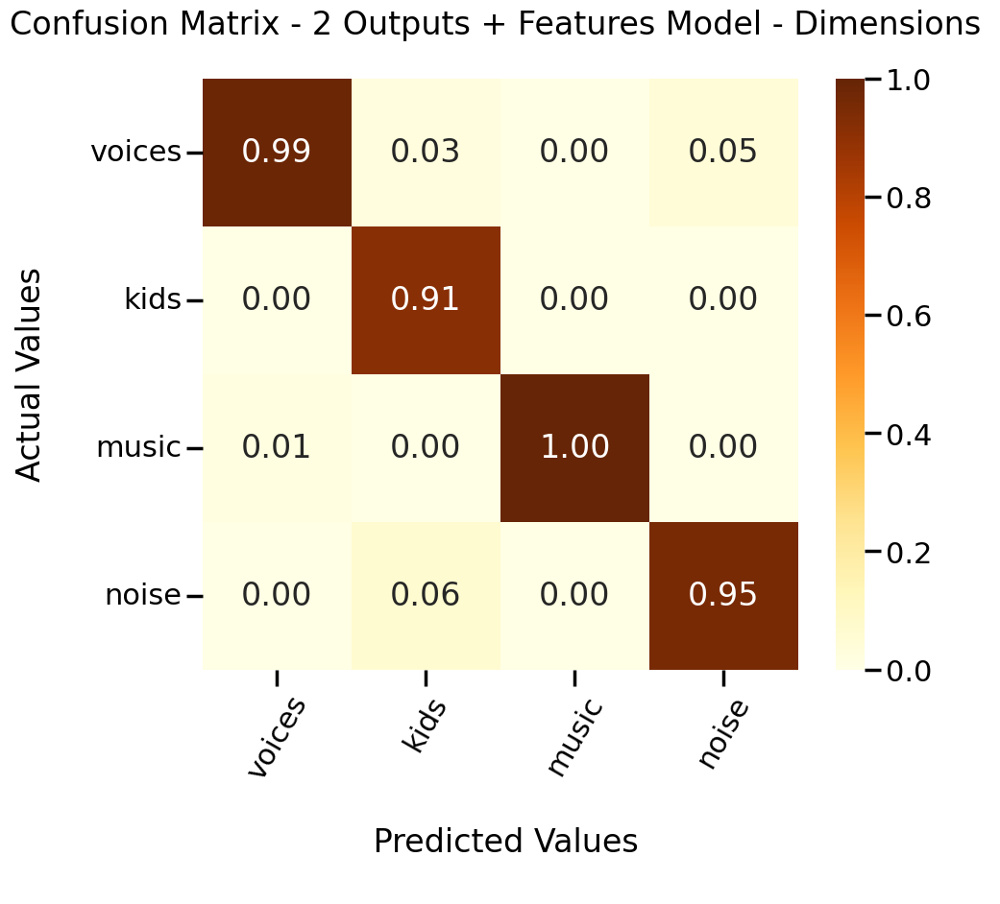

In [14]:
plot_cm(y_test[0],  np.array(results_output1),
        'Confusion Matrix - 2 Outputs + Features Model - Scenes \n',
        ["NATURE", "CAFE",'PUBLIC_TRANSPORT','HOME','OFFICE','CITY'])

plot_cm(list(y_test[1]),   # Dimension confusion matrix
        results_output2,
        'Confusion Matrix - 2 Outputs + Features Model - Dimensions \n',
        ['voices', 'kids','music', 'noise'])

In [15]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

#Plotting the Average


In [17]:
test         = load_data()
test = test.drop_duplicates('Label', keep='last').reset_index(drop = True)
average = test.groupby('Label')['Data'].mean().apply(lambda x: (x- np.mean(abs(x)))/ max(abs(x)))

In [22]:
def plot_spectrogram(data, title):
  D = librosa.stft(data)  # STFT of y
  S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
  plt.figure()
  plt.title(title)
  librosa.display.specshow(S_db)
  plt.colorbar()

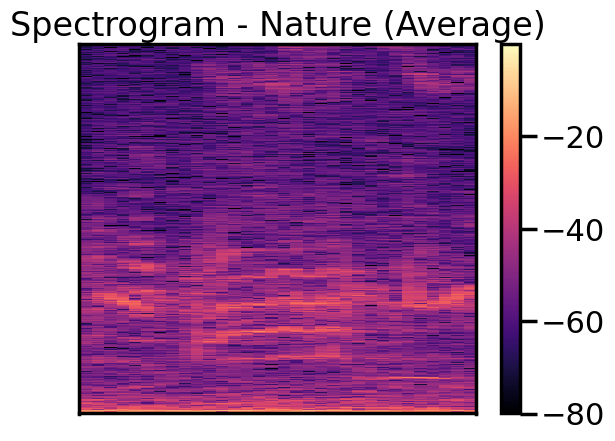

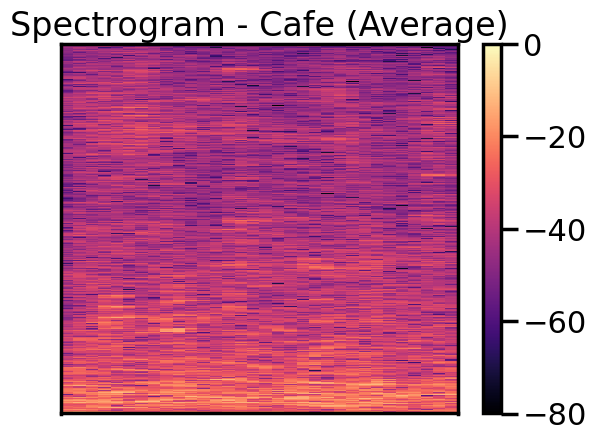

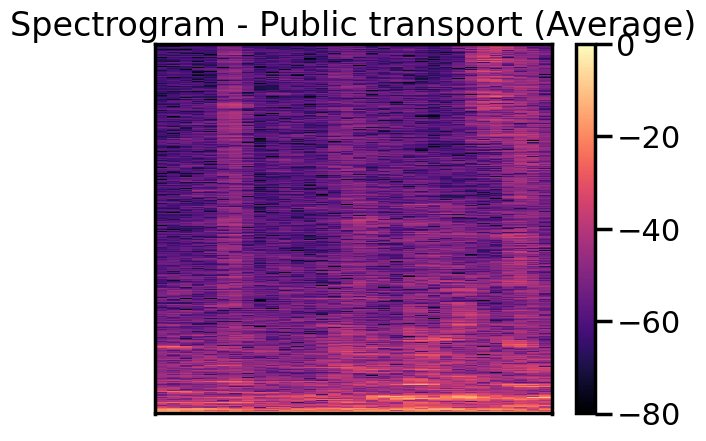

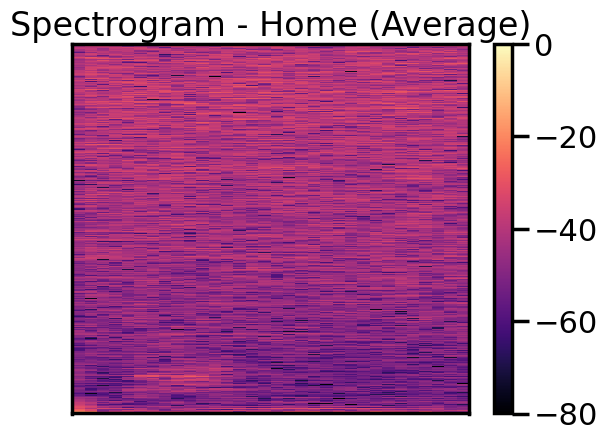

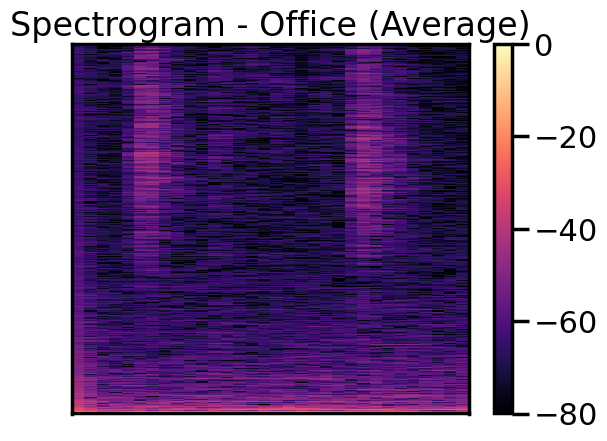

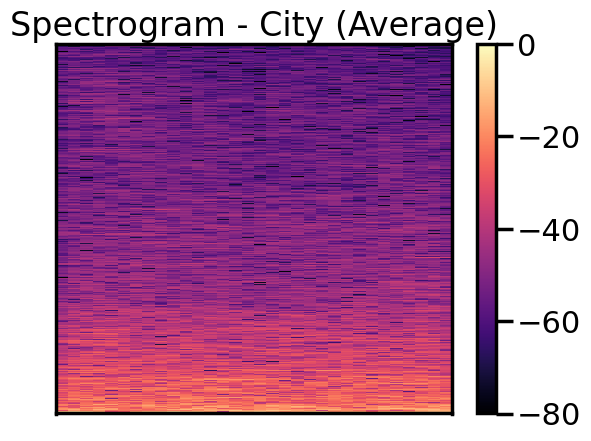

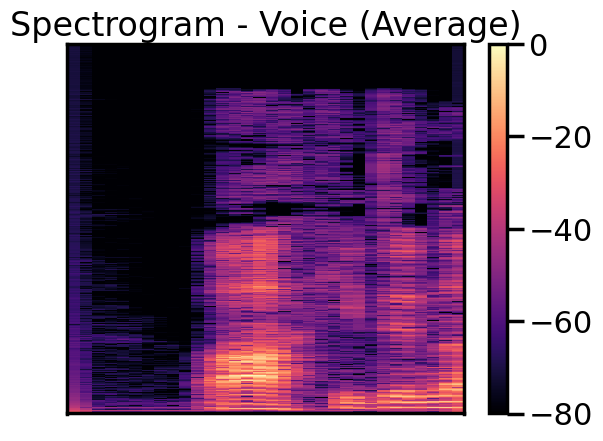

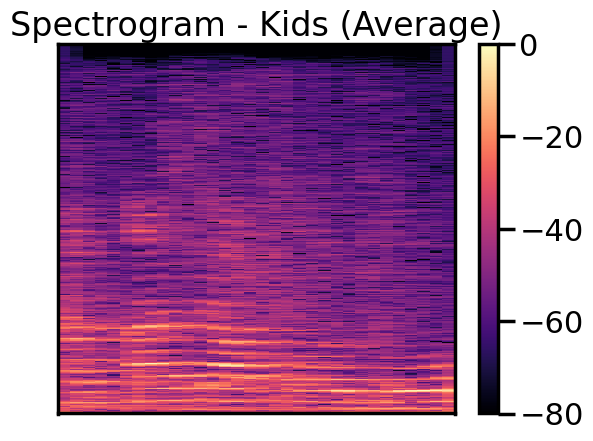

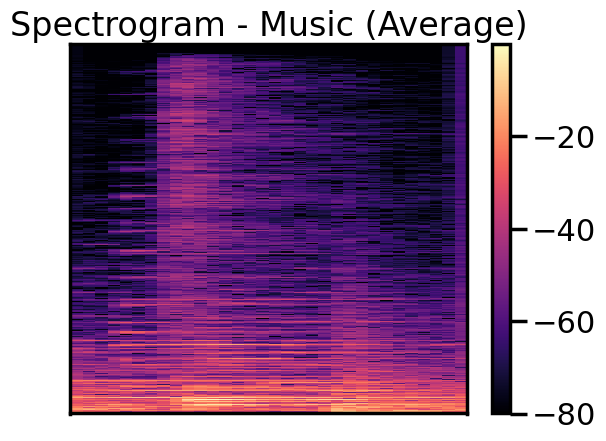

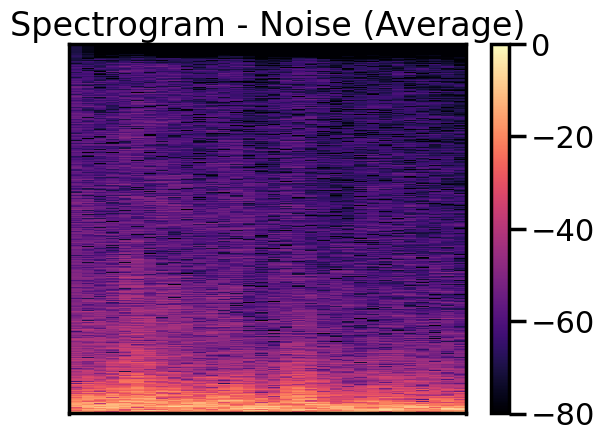

In [23]:
# Scenes
plot_spectrogram(average[0], "Spectrogram - Nature (Average)")
plot_spectrogram(average[1], "Spectrogram - Cafe (Average)")
plot_spectrogram(average[2], "Spectrogram - Public transport (Average)")
plot_spectrogram(average[3], "Spectrogram - Home (Average)")
plot_spectrogram(average[4], "Spectrogram - Office (Average)")
plot_spectrogram(average[5], "Spectrogram - City (Average)")

# Dimensions
plot_spectrogram(average['A'], "Spectrogram - Voice (Average)")
plot_spectrogram(average['B'], "Spectrogram - Kids (Average)")
plot_spectrogram(average['C'], "Spectrogram - Music (Average)")
plot_spectrogram(average['D'], "Spectrogram - Noise (Average)")